# Entregable final: Frenado Electromagnético

# Código

In [45]:

import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
# Una vez que sepamos bien como animarlo, las incluiremos
import matplotlib.animation as animation 
import matplotlib.cm as cm
import matplotlib.colors

from matplotlib import rc
from IPython.display import HTML

In [46]:
# Aceleración
g = 9.81

# Masa del dipolo
m = 0.05

# es la permeabilidad máxima del MetGlass
mu = 1e6

# Permeabilidad del espacio libre
mu_0 = 4*np.pi*1e-7

# Radio del anillo de corriente
r = 0.8

# Resistividad
R = 9e-5

In [47]:
# Constante de constantes
# Para facilitar los cálculos
k = (9*((mu*mu_0)**2)*r**4)/(4*R)

In [48]:
def p(z):
    #Donde a es el radio y z la pos
    return (z**2)/np.sqrt( (z**2 + r**2)**5 )
def f(t,x,y):
    return  y
def j(t,x,y):
    # Tu código aquí
    return - g - ((k/m) * p(x) * y)

In [49]:
# Tiempo inicial
t_0 = 0
# Timpo final
t_f = 10

# Altura Inicial z_0
x_0 = 70
# Velocidad Inicial z'_0
y_0 = 0

In [50]:
# Paso horizontal
h = 0.01

# Número de pasos
# Calcula el número de pasos entre t_0 y t_f cuando tienes un paso horizontal de h
N = int((t_f-t_0)/h)

# Arreglo con valores del tiempo:
# Usa np.linspace() para definir un arreglo que vaya de t_0 a t_n en N pasos
t = np.linspace(t_0, t_f, N)

In [51]:
def calcNext(varN, *all_Ks):
    sum_Ks = sum(all_Ks, 0)
    return varN + (h/6)*(sum_Ks)

def calc_Ks(time, position, velocity):
    # Nótese que no se pueden calcular por separado las Ks
    # Ya que dependen entre ellas.
    k_x1 = f(time, position, velocity)
    k_y1 = j(time, position, velocity)

    k_x2 = f(time + h/2, position + h/2*k_x1, velocity + (h/2*k_y1))
    k_y2 = j(time + h/2, position + h/2*k_x1, velocity + (h/2*k_y1))

    k_x3 = f(time + h/2, position + h/2*k_x2, velocity + (h/2*k_y2))
    k_y3 = j(time + h/2, position + h/2*k_x2, velocity + (h/2*k_y2))

    k_x4 = f(time + h, position + h*k_x3, velocity + (h*k_y3))
    k_y4 = j(time + h, position + h*k_x3, velocity + (h*k_y3))
    return [[k_x1,k_x3,k_x3,k_x4], [k_y1,k_y3,k_y3,k_y4]]

all_xs = [] 
all_ys = []

# Usar los valores iniciales para el primer paso
# No se pueden poner primero en la lista
# Al parecer nuestros calculos van retrasados por h
x_n = x_0
y_n = y_0

# Iterar para cada paso de la lista de tiempo t
# Usamos tqdm para generar una barra de progreso
for this_t in tqdm_notebook(t):

    x_Ks, y_Ks = calc_Ks(this_t, x_n, y_n)

    # Añadimos a la lista la siguiente posición de 
    # y_n y x_n
    all_xs.append(calcNext( x_n , *x_Ks))
    all_ys.append(calcNext( y_n , *y_Ks))
    
    # Actualizamos x_n y y_n en cada iteración
    x_n = all_xs[-1]
    y_n = all_ys[-1]


Text(0, 0.5, 'Rapidez [m/s]')

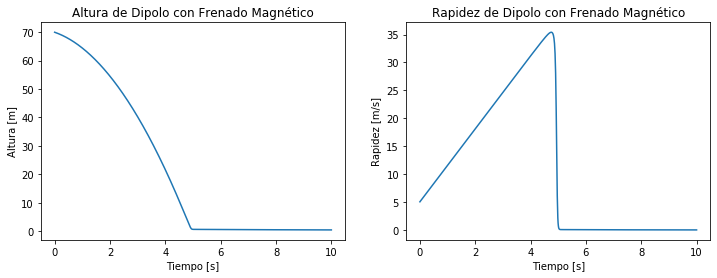

In [52]:
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)

plt.plot(t,all_xs)
plt.title("Altura de Dipolo con Frenado Magnético")
plt.xlabel("Tiempo [s]")
plt.ylabel("Altura [m]")

all_ys = [ x*-1 for x in  all_ys]
# l = [x * 2 for x in l]

plt.subplot(1,2,2)
plt.plot(t, all_ys)
plt.title("Rapidez de Dipolo con Frenado Magnético")
plt.xlabel("Tiempo [s]")
plt.ylabel("Rapidez [m/s]")


Text(0, 0.5, 'Fuerza [m/s]')

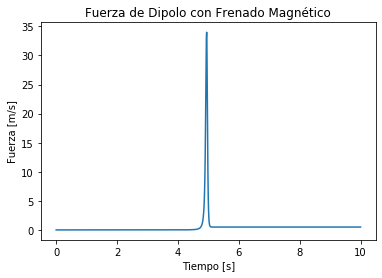

In [53]:
#Graficamos la fuerza 
F_t =  p(np.array(all_xs)) * np.array(all_ys) * - k
F_t = F_t*-1

plt.plot(t, F_t)
plt.title("Fuerza de Dipolo con Frenado Magnético")
plt.xlabel("Tiempo [s]")
plt.ylabel("Fuerza [m/s]")


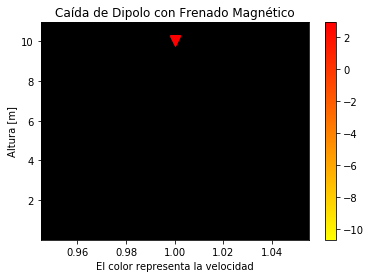

In [9]:
def animate(i):

    x = x_pos[i:i+2]
    y = all_xs[i:i+2]
    line.set_xdata(x)
    line.set_ydata(y)  # update the data.

    line.set_color(cmap(norm(-1*all_ys[i])))
    line.set_marker("v")
    line.set_markersize(10)
    return line,

fig, ax = plt.subplots()

x_pos = [1]*len(all_xs)
line, = ax.plot(x_pos, all_xs)


velocidades = list(set(all_ys))
velocidades.sort()

cmap = cm.get_cmap("autumn_r")

norm = matplotlib.colors.Normalize(vmin=-1*velocidades[-1], vmax=-1*velocidades[0])
colors = cm.ScalarMappable(cmap=cmap, norm=norm)

anim = animation.FuncAnimation(
    fig, func=animate, frames= range(0, len(all_xs)),interval =1)

plt.title("Caída de Dipolo con Frenado Magnético")
plt.ylabel("Altura [m]")
plt.xlabel("El color representa la velocidad")
ax.set_facecolor("#000000")
fig.colorbar(colors)
HTML(anim.to_jshtml())

plt.rcParams["animation.html"] = "jshtml"

anim